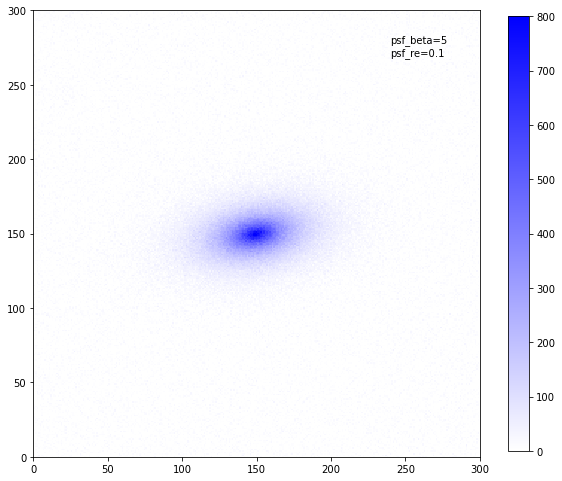

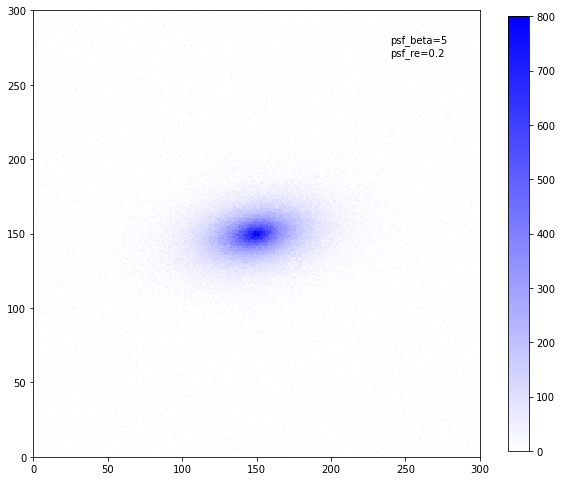

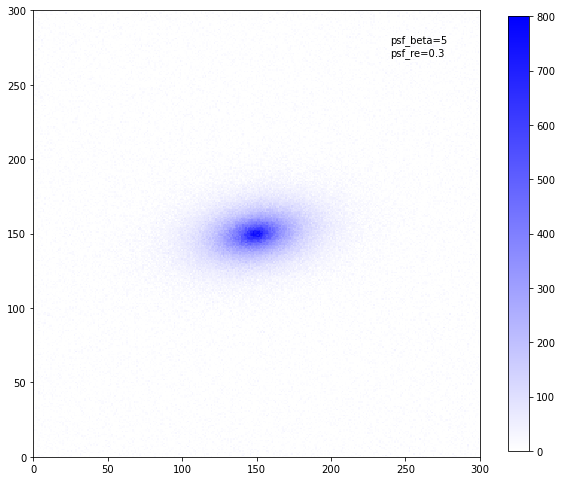

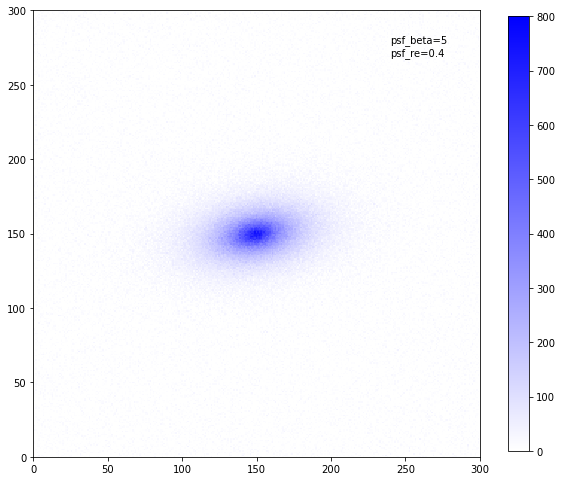

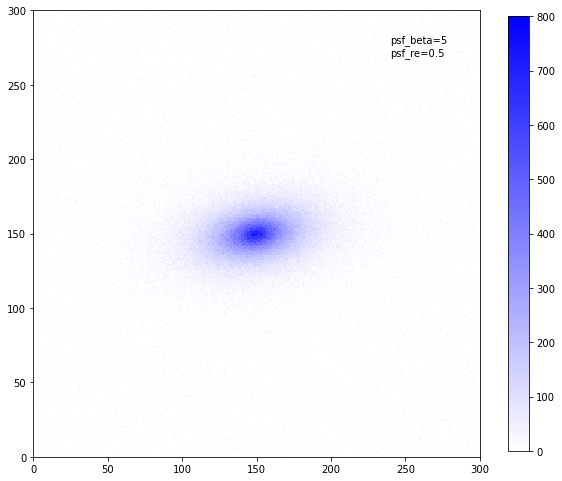

...

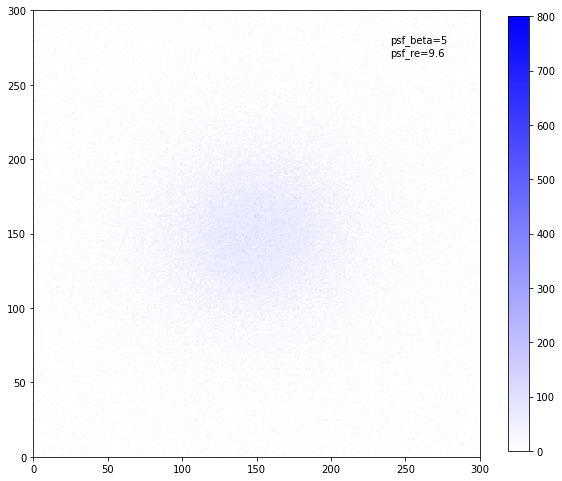

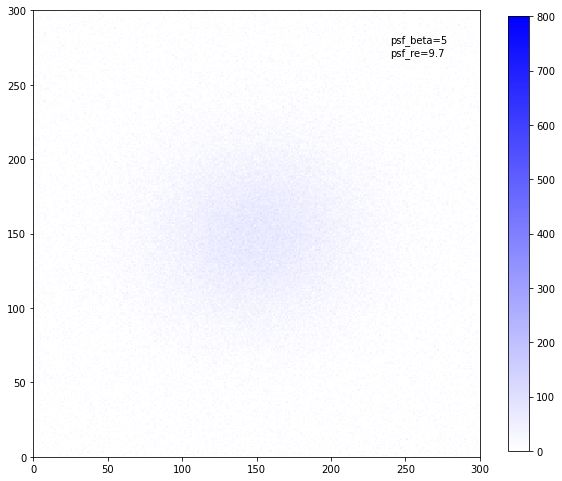

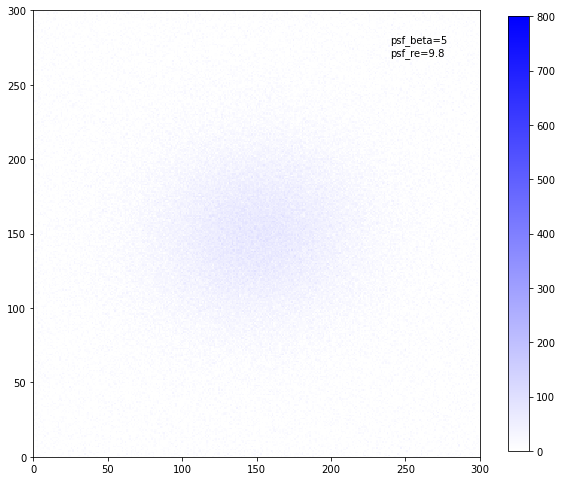

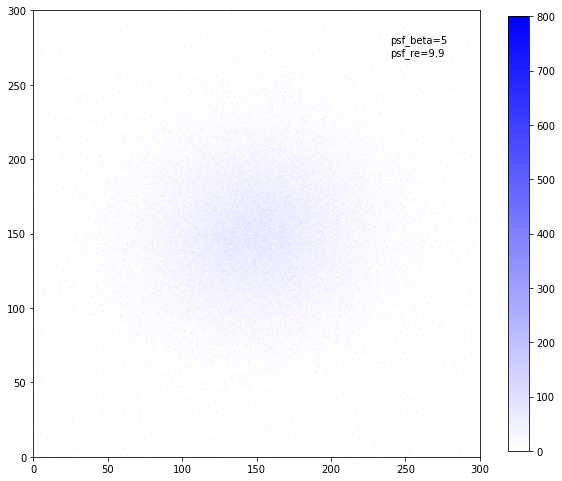

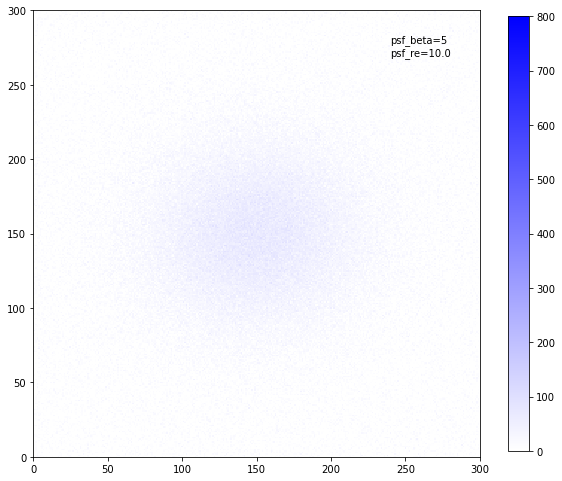

In [3]:
import numpy as np
import galsim
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib

gal_flux = 1.e6    # counts
gal_r0 = 2.7       # arcsec
g1 = 0.3           #
g2 = 0.1           #
psf_beta = 5
psf_re = 0         # arcsec
pixel_scale = 0.2  # arcsec / pixel
sky_level = 2.5e3

psf_max = 10

def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])


image_size = 300

for i in range(0, 10 * psf_max):
    
    psf_re += 0.1

    random_seed = galsim.BaseDeviate(76433).raw()

    rng = galsim.BaseDeviate(random_seed + 1)

    gal = galsim.Exponential(flux=gal_flux, scale_radius=gal_r0)

    gal = gal.shear(g1=g1, g2=g2)

    psf = galsim.Moffat(beta=psf_beta, flux=1., half_light_radius=psf_re)

    final = galsim.Convolve([gal, psf])
    
    # Create an image with the desired size and center the galaxy
    image = galsim.ImageF(image_size, image_size, scale=pixel_scale)
    final.drawImage(image=image)

    sky_level_pixel = sky_level * pixel_scale**2
    noise = galsim.PoissonNoise(rng, sky_level=sky_level_pixel)
    image.addNoise(noise)

    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [lighten_color('white', 0), lighten_color("blue", 1)])

    plt.figure(figsize=(10, 10))
    img = plt.imshow(image.array, interpolation='none', cmap=cmap, vmin=0, vmax=800)

    plt.text(0.8 * image_size, 0.9 * image_size, 'psf_beta=' + str(round(psf_beta, 1)) + '\n' 'psf_re=' + str(round(psf_re, 1)))
    plt.axis('on')


    plt.xlim(0, image_size)
    plt.ylim(0, image_size)
    plt.colorbar(shrink=0.8)
    plt.savefig("PSF_re=%.1f.png" % psf_re, bbox_inches='tight')
    plt.show()


    
